# <center>AI-Driven Predictive Maintenance for Apple Harvester Machinery


### In this exercise, generate some basic charts using Pandas
I will perform an exploratory analysis of the harvester machinet Engine  Dataset from .
Information and download link can be found here. https://archive.ics.uci.edu/dataset/601/ai4i+2020+predictive+maintenance+dataset

There are actually four datasets in the challenge, but here I will explore the one denoted as FD001. Firstly, I load libraries that will be used in the analysis:


In [21]:
# import data from pandas
import pandas as pd
import numpy as np
from tqdm.auto import tqdm
tqdm.pandas()
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
import plotly.offline as pyo
pyo.init_notebook_mode()
sns.set_theme()


#create the DataFrame utilizing Pandas 
df = pd.read_csv("./Data/train_FD001.txt", sep="\s", header=None)
df.columns = (["unit_number", "time_cycles", "operational_setting_1", "operational_setting_2", "operational_setting_3"] +  ["sensor_{}".format(i) for i in range(1, 26-5+1)])
df = df.drop([c for c in df.columns if np.isclose(df[c].var(), 0.0) or df[c].value_counts().pipe(lambda x: x/x.sum()).iloc[0] > 0.96], axis=1)
df.head()



,unit_number,time_cycles,operational_setting_1,operational_setting_2,sensor_2,sensor_3,sensor_4,sensor_7,sensor_8,sensor_9,sensor_11,sensor_12,sensor_13,sensor_14,sensor_15,sensor_17,sensor_20,sensor_21
0,1,1,-0.0007,-0.0004,641.82,1589.70,1400.60,554.36,2388.06,9046.19,47.47,521.66,2388.02,8138.62,8.4195,392,39.06,23.4190
1,1,2,0.0019,-0.0003,642.15,1591.82,1403.14,553.75,2388.04,9044.07,47.49,522.28,2388.07,8131.49,8.4318,392,39.00,23.4236
2,1,3,-0.0043,0.0003,642.35,1587.99,1404.20,554.26,2388.08,9052.94,47.27,522.42,2388.03,8133.23,8.4178,390,38.95,23.3442
3,1,4,0.0007,0.0000,642.35,1582.79,1401.87,554.45,2388.11,9049.48,47.13,522.86,2388.08,8133.83,8.3682,392,38.88,23.3739
4,1,5,-0.0019,-0.0002,642.37,1582.85,1406.22,554.00,2388.06,9055.15,47.28,522.19,2388.04,8133.80,8.4294,393,38.90,23.4044


###  Part One:Group by and split the data into 75 units in the training set , 25 in the validation set.


In [8]:
#Please generate a basic histogram and save the histogram as a png file
# Hint: use pandas histogram function.

df = (df
    .groupby("unit_number", group_keys=False)
    .apply(lambda x: x.assign(RUL=x["time_cycles"].max() - x["time_cycles"])))

df["unit_number"].nunique()
# => 100
from sklearn.model_selection import train_test_split

# mistake! (Data leakge)
train_df, val_df = train_test_split(df, test_size=0.25)
# because the same units are found in both splits
train_units = train_df["unit_number"].pipe(set)
val_units = val_df["unit_number"].pipe(set)
len(train_units.intersection(val_units))

# => 100

from sklearn.model_selection import train_test_split

train_units, val_units = train_test_split(df["unit_number"].unique(), test_size=0.25, random_state=1337)
train_df = df.query("unit_number in @train_units")
val_df = df.query("unit_number in @val_units")
# "&" is the same as intersection and "|" is the same as union
# note: not empty set is equal to true
assert not (train_df["unit_number"].pipe(set) & val_df["unit_number"].pipe(set))
print(train_df["unit_number"].nunique(), val_df["unit_number"].nunique())
# => (75, 25)

75 25


###  Part Two: Visualize the distribution of survival length, i.e. the max time_cycles for each unit


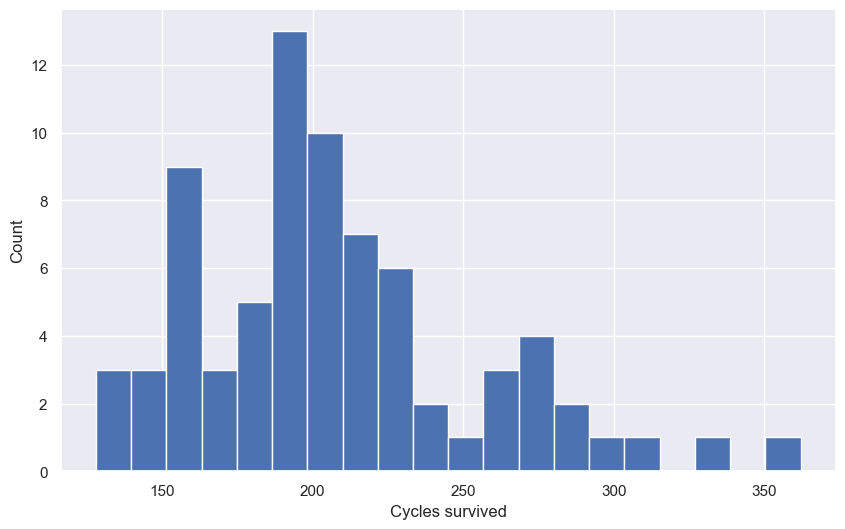

In [9]:
#Please generate a basic scatter plot utilizing Age as the x axis and Salary as the y axis
# Hint: use pandas scatter function to generate the chart.
train_df.groupby("unit_number")["time_cycles"].max().hist(bins=20, figsize=(10, 6))
plt.xlabel("Cycles survived")
plt.ylabel("Count")
plt.show()





We can see that the distribution is quite wide, from 128 to 362 cycles. Let’s have a look at the available features:
###  Part Three: Features 

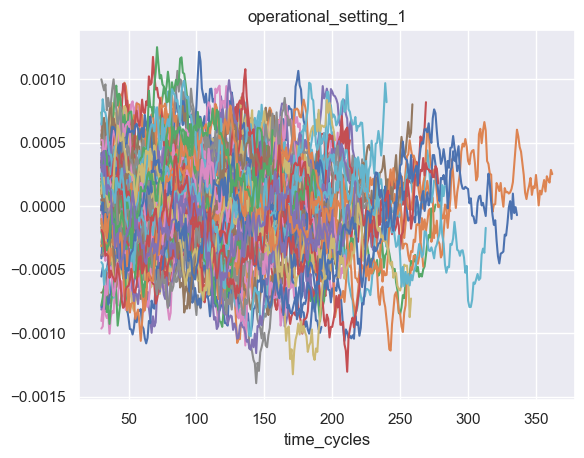

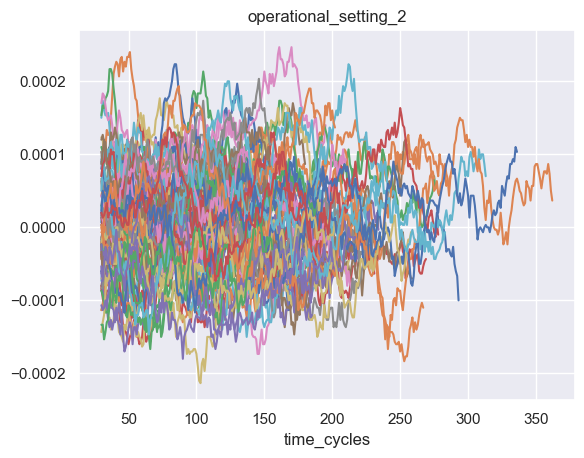

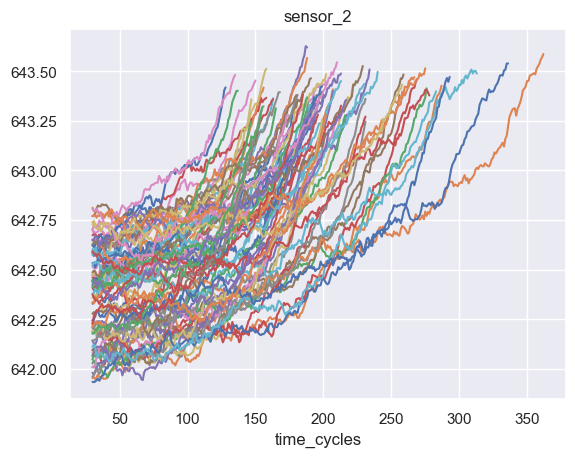

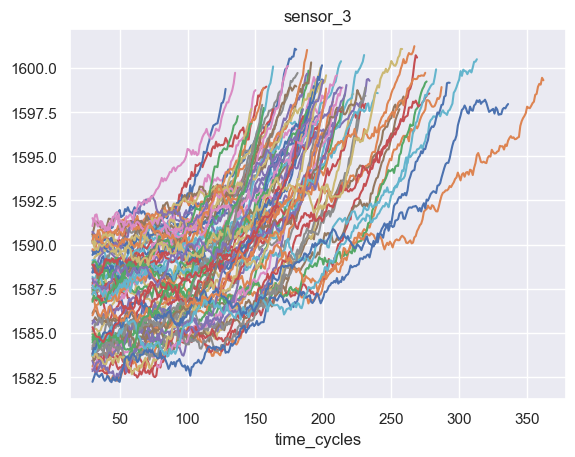

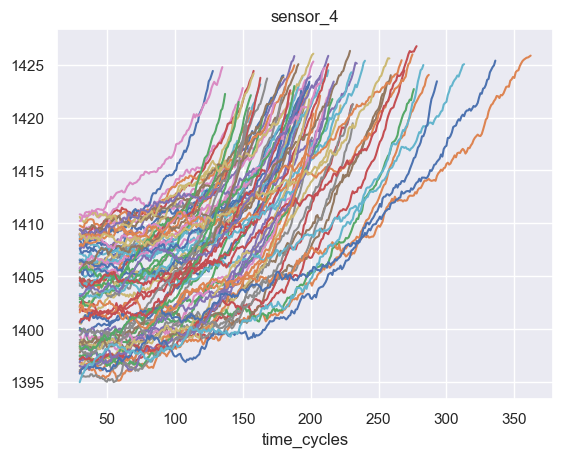

...

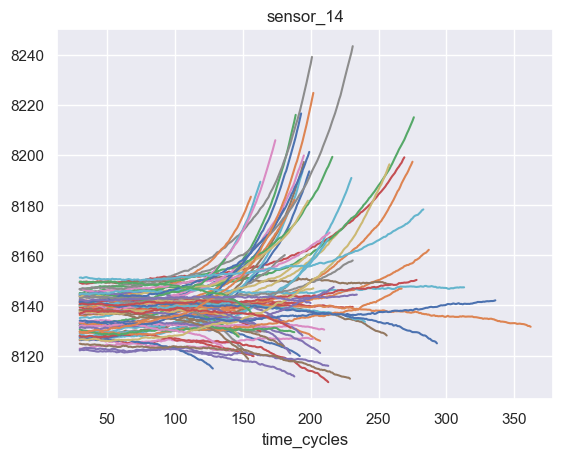

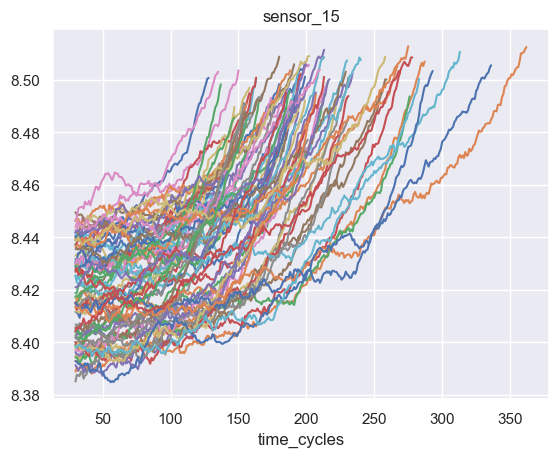

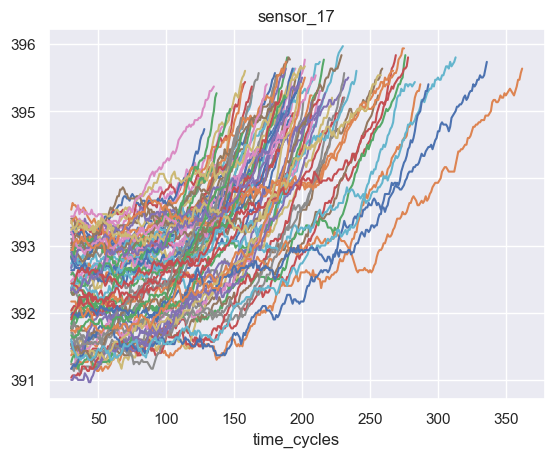

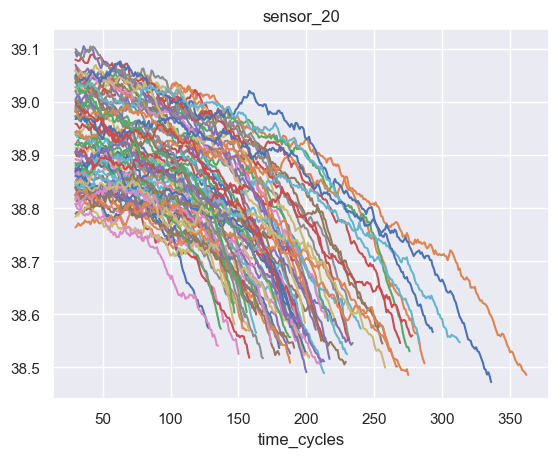

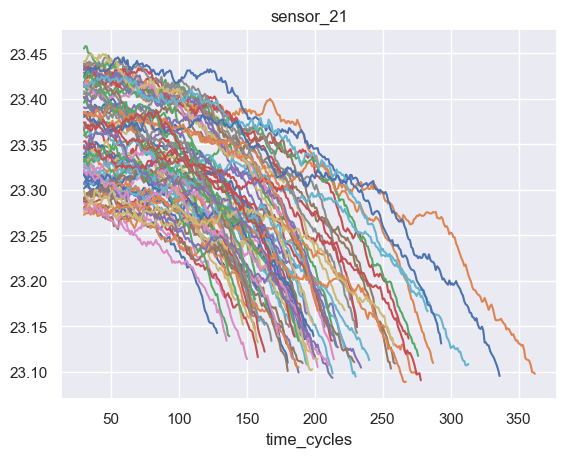

In [10]:
features = [c for c in df.columns if c not in ["unit_number", "time_cycles", "RUL"]]
for c in features:
    (train_df
         .set_index("time_cycles")
         .groupby("unit_number")
         .apply(lambda x: x[c].rolling(window=30).mean().plot(title=c)))
    plt.show()



As can be seen from the sensor measurements, there are clearly trends as the number of cycles increases and the jet engine degrades. Next, let’s visualize the correlation using a heatmap with seaborn:

###  Part Four: Correlation using a heatmap with seaborn

<Axes: >

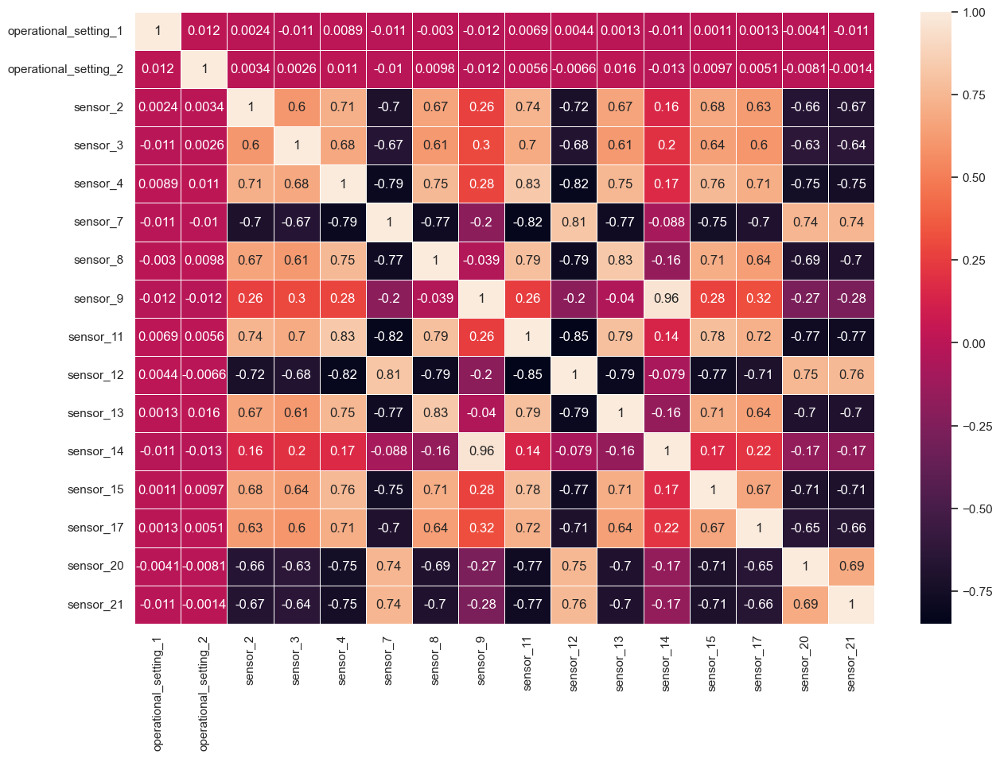

In [11]:
plt.subplots(figsize=(15, 10))
sns.heatmap(train_df[features].corr(), annot=True, cbar=True, linewidths=.5)




###  Part Five: PCA decomposition 

There are, as expected, large correlations between many of the sensor measurements. Because of these linear relationships, it would make sense to perform a PCA decomposition to visualize the data in a lower dimensional space. 

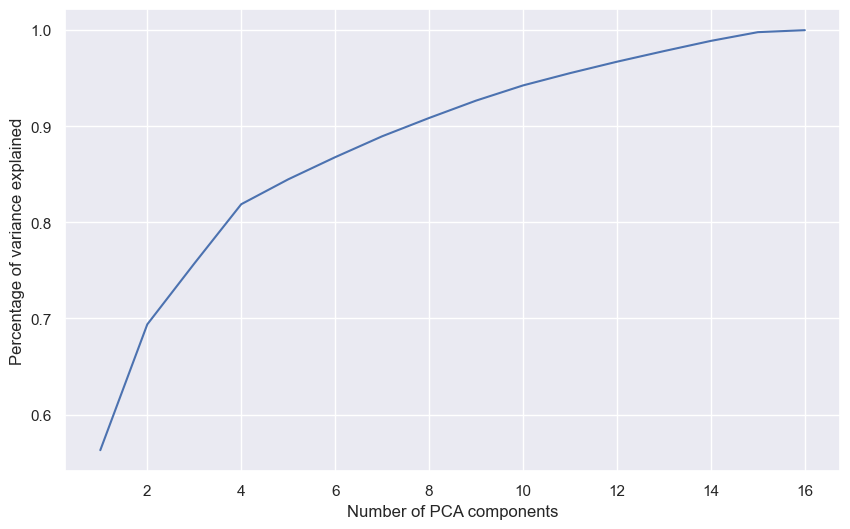

In [12]:
from sklearn.decomposition import PCA
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler

pipeline = Pipeline([
    ("scaler", StandardScaler()),
    ("pca", PCA())
])
pipeline.fit(train_df[features])
csum_variance = pipeline.named_steps["pca"].explained_variance_ratio_.cumsum()
plt.subplots(figsize=(10, 6))
plt.plot(np.arange(1, csum_variance.shape[0]+1), csum_variance)
plt.xlabel("Number of PCA components")
plt.ylabel("Percentage of variance explained")
plt.show()

###  Part Five: PCA decomposition  Two first principal components together with the RUL

In [13]:
import plotly.express as px

pipeline = Pipeline([
    ("scaler", StandardScaler()),
    ("pca", PCA(n_components=2))
])
pca_components = pipeline.fit_transform(train_df[features])
for i in range(pca_components.shape[1]):
    train_df[f"pca_component_{i+1}"] = pca_components[:, i]
    
fig = px.scatter_3d(train_df, x="pca_component_1", y="pca_component_2", z="RUL", color="unit_number", size_max=0.002)
fig.update_traces(marker_size = 3)
fig.update_layout(
    title='PCA state visualization',
    title_x=0.5,
    width=800,
    height=800,
    margin=dict(l=65, r=50, b=65, t=90)
)
fig.show()

In the healthy state, i.e. when the RUL is large, the component has a small value, < 0, but as it starts to degrade it increases toward 5–10 before failure. For the second component, the pattern isn’t so clear. While initially the values seem consistent, as it degrades it moves in different directions. To investigate these findings further, let’s visualize each component individually:

In [14]:

import plotly.express as px
for c in ["pca_component_1", "pca_component_2"]:
    fig = px.scatter(train_df, x=c, y="RUL", color="unit_number", width=800, height=600)
    fig.show()

Setting the x-axis in a 3D plot to be the unit_number

In [15]:
import plotly.express as px

pipeline = Pipeline([
    ("scaler", StandardScaler()),
    ("pca", PCA(n_components=2))
])
pca_components = pipeline.fit_transform(train_df[features])
for i in range(pca_components.shape[1]):
    train_df[f"pca_component_{i+1}"] = pca_components[:, i]
    
fig = px.scatter_3d(train_df, x="pca_component_1", y="pca_component_2", z="RUL", color="unit_number", size_max=0.002)
fig.update_traces(marker_size = 3)
fig.update_layout(
    title='PCA state visualization',
    title_x=0.5,
    width=800,
    height=800,
    margin=dict(l=65, r=50, b=65, t=90)
)
fig.show()

In [16]:
import plotly.express as px

pipeline = Pipeline([
    ("scaler", StandardScaler()),
    ("pca", PCA(n_components=2))
])
pca_components = pipeline.fit_transform(train_df[features])
for i in range(pca_components.shape[1]):
    train_df[f"pca_component_{i+1}"] = pca_components[:, i]
    
fig = px.scatter_3d(train_df, x="pca_component_1", y="pca_component_2", z="RUL", color="unit_number", size_max=0.002)
fig.update_traces(marker_size = 3)
fig.update_layout(
    title='PCA state visualization',
    title_x=0.5,
    width=800,
    height=800,
    margin=dict(l=65, r=50, b=65, t=90)
)
fig.show()

One interesting observation is that even though the rolling PCA component value of two units could be the same, the corresponding RUL could vary greatly. What could be the cause of this? Is it just randomness or are there other features explaining this behavior? I noted unit numbers 9 and 22 differed greatly. Let’s visualize these values for the second PCA component 2. I’ll use the same code except I’ll change the color to highlight unit 9 and 22 and swap PCA component 1 to PCA component 2:

In [17]:
unit_to_color = { u: u in [9, 22] for u in train_df["unit_number"].unique() }
fig = px.scatter_3d((
    train_df
    .pipe(lambda x: x[x["RUL"] <= x.groupby("unit_number")["time_cycles"].max().min()])
    .assign(
        color=train_df.unit_number.apply(unit_to_color.get)
    )
    .groupby("unit_number", group_keys=False)
    .apply(lambda x: x.assign(rolling_pca_component_2=lambda x: x.pca_component_2.rolling(window=10).mean()))), 
    x="unit_number", 
    y="rolling_pca_component_2", 
    color="color", 
    z="RUL"
)
fig.update_traces(marker_size = 3)
fig.update_layout(
    title='Side by side',
    title_x=0.5,
    width=800,
    height=800,
    margin=dict(l=65, r=50, b=65, t=90)
)
fig.show()

As can be seen, for the second PCA component these units seem to be on opposite sides in the graph. Almost like the second PCA component represents some kind of acceleration of the first PCA component from the healthy small values to the larger values they have at failure. Let’s change the color of the earlier 3D graph for PCA component 1 to represent the second PCA component and plot both components in the same plot:

In [19]:
fig = px.scatter_3d((
    train_df
    .pipe(lambda x: x[x["RUL"] <= x.groupby("unit_number")["time_cycles"].max().min()])
    .groupby("unit_number", group_keys=False)
    .apply(lambda x: x.assign(
        rolling_pca_component_1=lambda x: x.pca_component_1.rolling(window=10).mean()
    ))), 
    x="unit_number", 
    y="rolling_pca_component_1", 
    color="pca_component_2", 
    z="RUL"
)
fig.update_traces(marker_size = 3)
fig.update_layout(
    title='Side by side',
    title_x=0.5,
    width=800,
    height=800,
    margin=dict(l=65, r=50, b=65, t=90)
)
fig.show()

###  Part Size: Analyse the correlation 
To finalize the analysis of their relationship, let’s calculate the value of the PCA component 1 and 2 when the RUL is 100 for every time series and then see if there is a correlation:

In [20]:
train_df.query("RUL == 100")[["pca_component_1", "pca_component_2"]].corr()


,pca_component_1,pca_component_2
pca_component_1,1.000000,-0.462607
pca_component_2,-0.462607,1.000000


Indeed there is. Thus, we can conclude that only keeping the first principal component is likely a poor choice.

Conclusion
Exploratory analysis and visualization can be rewarding in many situations to interpret and understand data. It can uncover insights that lead to better modeling, discover weaknesses, lack of information or reveal potential applications. In predictive maintenance, it can be very useful to get an understanding of how well the data describes the degradation phenomenon. In this case, there were clear relationships between many of the sensor measurements and the RUL, but this is not always the case. Sometimes extensive feature extraction is necessary and other times the data acquisition itself needs to be improved due to the lack of predictive power in the data.